# <font color='red'>TME ROBOTIQUE ET APPRENTISSAGE</font>
# <font color='red'>Stratégies d'Evolution et Robotique Autonome</font>

<font color="red">Version étudiant 2021</font>

*mise à jour: 5/3/2021*

Ce notebook doit être exécuté dans [Google Colab](colab.research.google.com/)

Vous devez déposer votre travail sur Moodle:
* déposer votre notebook, avec le nom de fichier *obligatoirement* au format suivant: **RA_NOM1_NOM2.ipynb**
* toutes les cellules exécutées
* des graphes et un bref commentaire lorsque c'est demandé
* la partie C ne sera pas évaluée

*Le sujet est à faire en binome.*

# COMPLETEZ LES CHAMPS CI-DESSOUS AVEC NOM/PRENOM/CARTE_ETU:

* Étudiant 1: **Willaime-Angonin Julien 3706969**
* Étudiant 2: **ZUO Nicolas 3702107**



# <font color='orange'>PARTIE A: optimisation dans un espace de recherche continu</font>

# Importation des librairies et définition des fonctions utiles pour la partie A

Remarque: *Il est nécessaire d'exécuter ces cellules une seule fois. En cas de redémarrage du noyau, il faut relancer ces cellules. Il n'est pas nécessaire de regarder le code de ces cellules, elles servent seulement de soutien à la partie A.*

In [20]:
from datetime import datetime
from datetime import date
#import importlib # une seule fois
import sys
import random
import matplotlib.pyplot as plt
#from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
import numpy as np
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from scipy.optimize import minimize

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 16:46:08 GMT
OK.


In [21]:
#!pip install numpy scipy matplotlib pandas sympy nose
!pip install deap
!pip install cma
#!pip install --user pygame

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 16:46:15 GMT
OK.


In [22]:
# plot

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
import numpy as np
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import random
from scipy.optimize import minimize


def plot_results(my_func, my_points, min_x=-30, max_x=30, min_y=-30, max_y=30, nbx=100, nby=100, title="Title"):
    """Plots a 2D function with a heatmap and the points given as argument are plotted on top of it

    Plots a 2D function with a heatmap and the points given as argument are plotted on top of it:
    :param my_func: the function to plot on the background
    :param my_points: the points to plot
    :param min_x: min value of x
    :param max_x: max value of x
    :param min_y: min value of y
    :param max_y: max value of y
    :param nbx: number of my_func samples on the X-axis
    :param nby: number of my_func samples on the Y-axis
    :param title: title of the figure
    """
    X = np.linspace(min_x, max_x, num=nbx)
    Y = np.linspace(min_y, max_y, num=nby)
    Z=np.zeros((nbx,nby),dtype=np.double)
    for i in range(nbx):
        for j in range(nby):
            Z[i][j]=my_func([X[i],Y[j]])
    fig,ax=plt.subplots(figsize=(5,5))
    ax.set_xlim(min_x,max_x)
    ax.set_ylim(min_y,max_y)
    ax.imshow(Z, cmap='hot', interpolation='nearest',extent=(min_x,max_x,min_y,max_y))
    
    #print("Points: "+str(my_points))
    x=[]
    y=[]
    for p in my_points:
        x.append(p[0])
        y.append(p[1])

    ax.plot(x,y,".")
    ax.set_title(title)
    plt.show()

def plot_violin(res):
    """ Makes a violin plot of the results provided in the argument

    Makes a violin plot of the results provided in the argument.
    :param res: dictionary of the results to plot. The key is the name and the data is a vector of performance values.
    """
    fig,ax=plt.subplots(figsize=(5,5))
    data=[]
    labels=[]
    for k in res.keys():
        data.append(res[k])
        labels.append(k)
    ax.violinplot(data,
                   showmeans=False,
                   showmedians=True)
    ax.set_title('Violin plot')
    # adding horizontal grid lines
    ax.yaxis.grid(True)
    ax.set_xticks([y + 1 for y in range(len(data))])
    ax.set_xlabel('Optimization methods')
    ax.set_ylabel('Best value found')

    # add x-tick labels
    plt.setp(ax, xticks=[y + 1 for y in range(len(data))],
        xticklabels=labels)
    plt.setp(ax.get_xticklabels(), rotation=30, ha="right")
    plt.show()
  
print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 16:46:15 GMT
OK.


In [23]:
# myEvalFn
# requires: CMA

import sys
import cma
import cma.purecma as purecma
from deap import benchmarks

def ackley(x):
    return benchmarks.ackley(x)[0]

def sphere(x):
    return benchmarks.sphere(x)[0]

def rastrigin(x):
    return benchmarks.rastrigin(x)[0]


#### #### ####

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 16:46:15 GMT
OK.


In [24]:
# myEvalFn

def ackley(x):
    return benchmarks.ackley(x)[0]

def sphere(x):
    return benchmarks.sphere(x)[0]

def rastrigin(x):
    return benchmarks.rastrigin(x)[0]

init_pSG = False # WARNING: pSG.initAll() should NEVER be called BEFORE calling explore(.)
def explore(x):  # NOTE: display should be false whenever an optimiser is called
    global init_pSG
    if init_pSG == False:
        pSG.initAll()
        init_pSG = True
    return -pSG.evaluate(x)   # remember: we minimise!

#### #### ####

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 16:46:15 GMT
OK.


---

# Exercice A-0: recherche au hasard

Etudiez le code ci-dessous. Il s'agit d'un algorithme de recherche aléatoire, qui explore l'environnement naïvement et stocke le meilleur score obtenu jusqu'ici. Vous testerez cette bibliothèque sur la fonction de Sphere, Ackley, puis Rastrigin, en dimension 2 pour l'instant. Observez l'évolution de la population. Vous étudierez l'impact du choix du point initial. **Le code se trouve le fichier `myRandom.py`**.

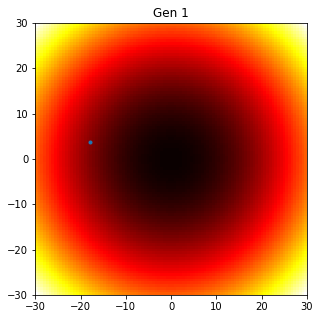

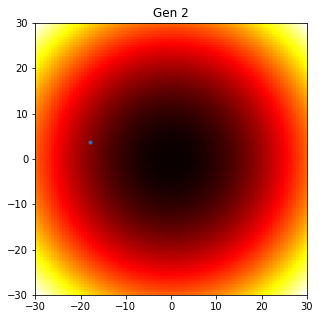

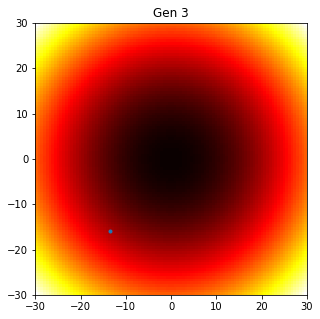

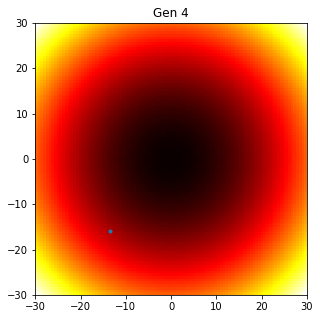

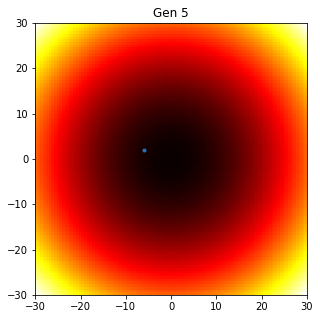

...

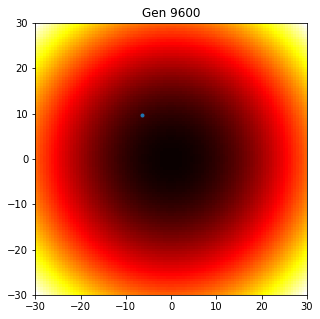

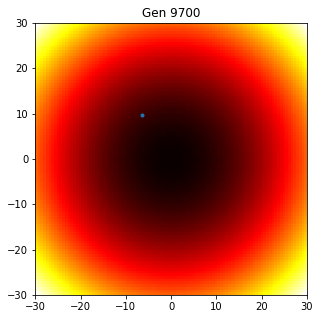

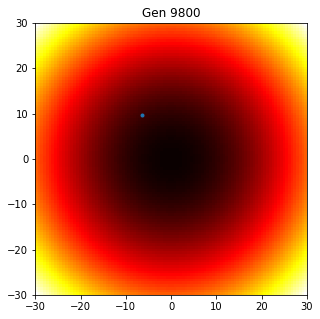

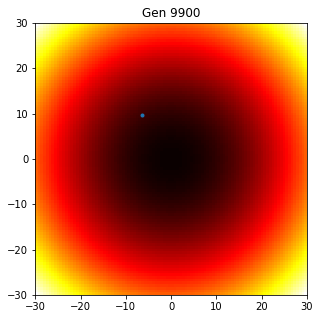

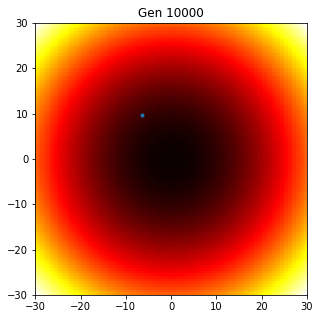

Best fit 595.5175624899169 at iteration 7984
Terminé.


In [ ]:
# fourni a titre d'exemple, ne pas modifier -- reprendre ce code et le modifier dans les cellules suivantes pour répondre aux questions.

def launch_random(center, nbeval=10000, display=True, ma_func=sphere):
    parent = np.array(center)
    i=0
    j=0
    parentFit = ma_func(parent)
    bestFit = parentFit
    bestIt = 0
    while i<nbeval:
        child = np.random.uniform(-20,20,len(center))
        childFit = ma_func(child)
        if childFit <= parentFit:
            parentFit = childFit
            parent = np.copy(child)
            if bestFit > parentFit:
                bestFit = parentFit
                bestIt = i
        j+=1
        solutions = np.array([parent])
        if display and ((j<10) or (j%100==0)):
            plot_results(ma_func,solutions, title="Gen %d"%(j))
        i+=1
    if(display):
      print ("Best fit",bestFit,"at iteration",bestIt)
    return bestFit

launch_random([100]*16,ma_func=sphere,display=True)

print ("Terminé.")

La marche étant aléatoire, le point de départ n'importe que si sa valeur de fitness est deja très bonne . Sinon le résultat est totalement aléatoire. Et plus il se rapproche de l'optimum plus il est difficile de converger

---

# Exercice A-1: algorithme (1+1)-ES

Nous allons maintenant implementer une stratégie d'évolution (1+1)-ES avec un sigma fixe.

Vous testerez cet algorithme sur les mêmes fonctions que précédemment. Vous tracerez l'évolution de la population pour chaque exécution. Vous étudierez l'impact du choix du point initial et du sigma.

A noter que si la valeur de sigma peut influer significativement l'optimisation, l'initialisation compte aussi. Par exemple, si la solution initialement proposée se trouve dans une région ressemblant à un plateau (ie. plusieurs solutions proches obtiennent le même score), il sera difficile d'améliorer cette solution puisqu'une recherche locale s'apparentera à une marche aléatoire.

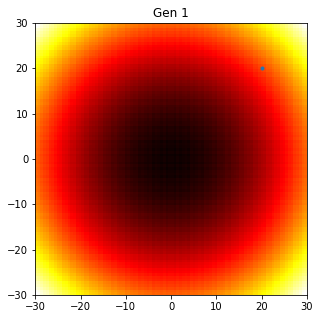

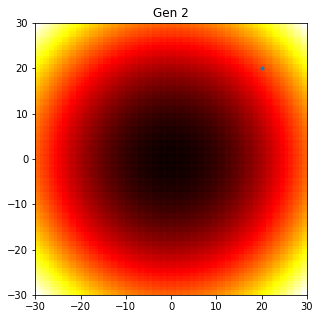

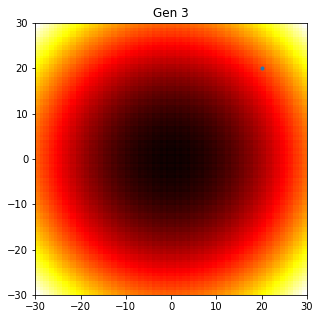

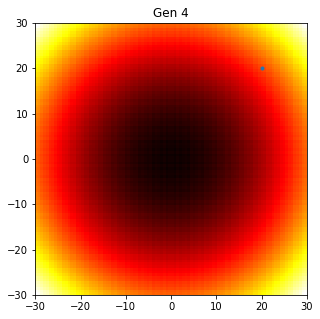

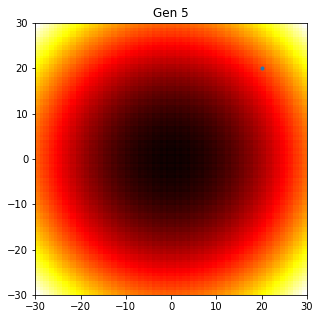

...

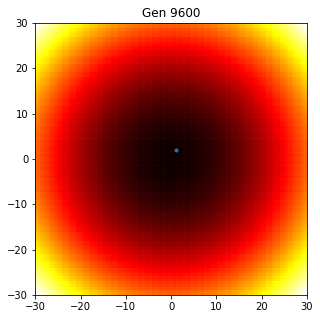

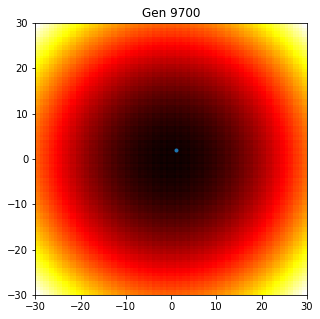

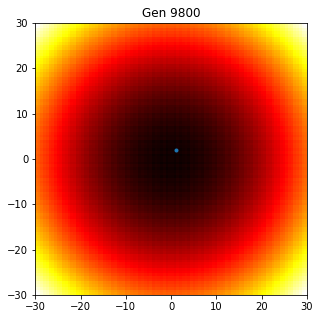

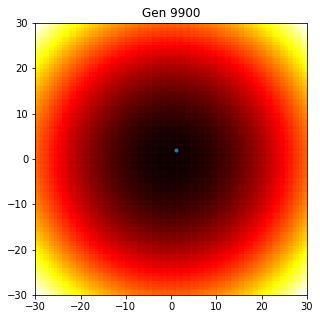

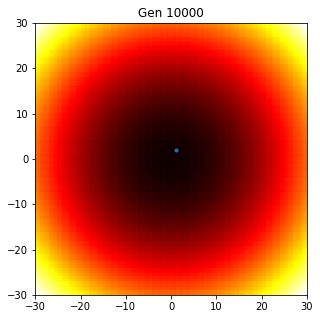

Best fit 98.21825338335034 at iteration 7137
Terminé.


In [ ]:
def launch_oneplusone(center, sigma, nbeval=10000, display=True, ma_func=sphere):
  # A compléter
  parent = np.array(center)
  i=0
  j=0
  parentFit = ma_func(parent)
  bestFit = parentFit
  bestIt = 0
  while i<nbeval:
      child =parent+ sigma*np.random.multivariate_normal([0]*len(parent),np.identity(len(parent)))
      childFit = ma_func(child)
      if childFit <= parentFit:
          parentFit = childFit
          parent = np.copy(child)
          if bestFit > parentFit:
              bestFit = parentFit
              bestIt = i
      j+=1
      solutions = np.array([parent])
      if display and ((j<10) or (j%100==0)):
          plot_results(ma_func,solutions, title="Gen %d"%(j))
      i+=1
  if(display):
    print ("Best fit",bestFit,"at iteration",bestIt)
  return bestFit

launch_oneplusone([20]*16,0.5,ma_func=rastrigin,display=True)

print ("Terminé.")

Le point de départ peut déterminer dans quelle zone de la courbe le résultat va être particulièrement s'il y a des minimum et des maximum locaux. Si le sigma est trop petit l'algorithme n'aura pas eu la possibilité d'évaluer les meilleurs solution (même locale) alors que si le sigma est trop grand, l'algorithme peut rater la meilleur solution et ne jamais tomber dessus(car il va trop loin à chaque fois). Et pour les fonctions tel que rastrigin, un sigma trop petit lui fera rester sur un optimum local

---

# Exercice A-2: algorithme (1+1)-ES, règle des 1/5e

Nous allons maintenant implementer une stratégie d'évolution (1+1)-ES avec un sigma suivant la règle des 1/5e.

Vous testerez cette algorithme sur les mêmes fonction que précédemment. Vous tracerez l'évolution de la population pour chaque exécution. Vous étudierez l'impact du choix du point initial et du sigma.

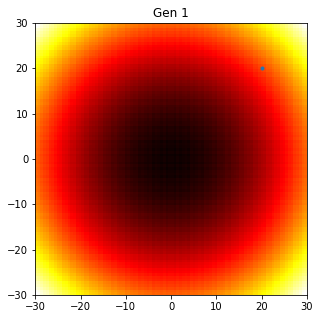

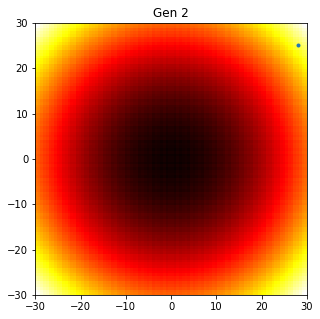

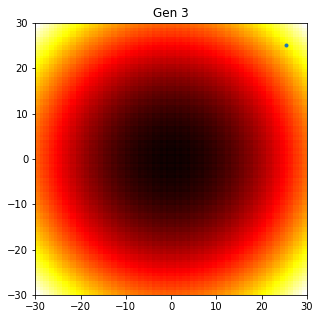

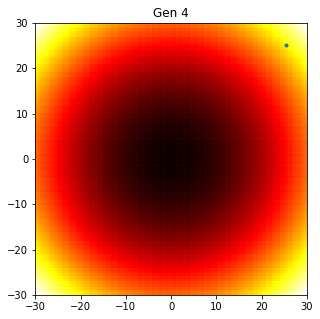

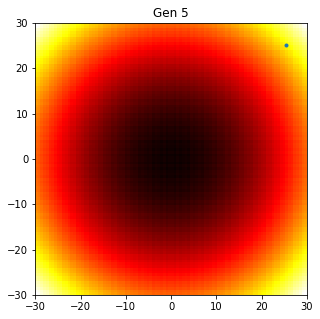

...

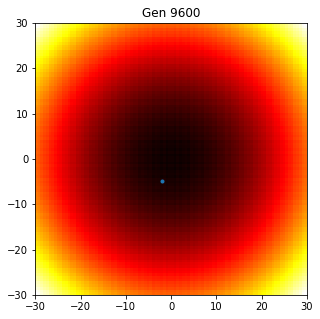

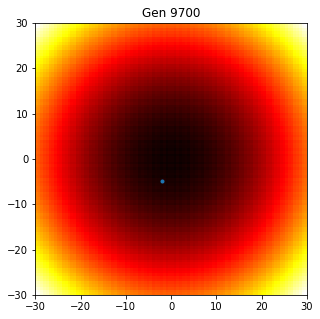

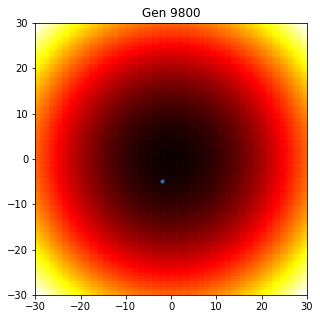

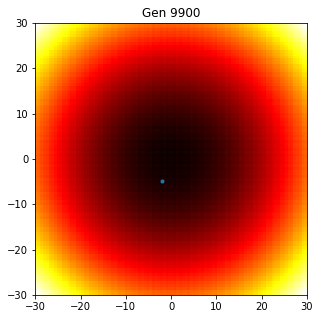

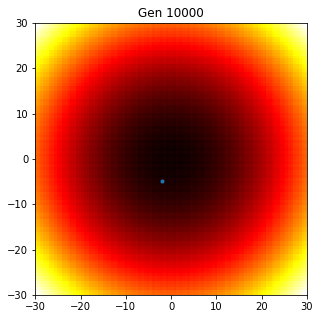

Best fit 384.04597804560467 at iteration 1928
Terminé.


In [ ]:
def launch_ESonefifthRule(center, sigma, nbeval=10000, display=True, ma_func=sphere):
  parent = np.array(center)
  i=0
  j=0
  parentFit = ma_func(parent)
  bestFit = parentFit
  bestIt = 0
  while i<nbeval:
      child =parent+ sigma*np.random.multivariate_normal([0]*len(parent),np.identity(len(parent)))
      childFit = ma_func(child)
      if childFit <= parentFit:
          parentFit = childFit
          parent = np.copy(child)
          sigma=2*sigma
          if bestFit > parentFit:
              bestFit = parentFit
              bestIt = i
      else:
        sigma=2**(-1/4)*sigma
      j+=1
      solutions = np.array([parent])
      if display and ((j<10) or (j%100==0)):
          plot_results(ma_func,solutions, title="Gen %d"%(j))
      i+=1
  if(display):
    print ("Best fit",bestFit,"at iteration",bestIt)
  return bestFit
launch_ESonefifthRule([20]*16,5,ma_func=rastrigin,display=True)
print ("Terminé.")

Ici, le point de départ importe moins qu'avec la version précédente de l'algorithme, mais dans le cas des fonctions avec minimum et maximum locaux, il influence toujours la zone dans laquel va se trouver le résultat final. Le sigma variant au cours de l'execution, sa valeur initiale n'a pas énormement d'importance dans le résultat. Mais sur les fonctions spécial tel que rastrigin il peut toute fois converger vers des optimums locaux

---

# Exercice A-3: algorithme (mu,lambda)-ES

Vous testerez cette algorithme sur les mêmes fonction que précédemment. Vous tracerez l'évolution de la population pour chaque exécution. Vous étudierez l'impact du choix du point initial et du sigma. 

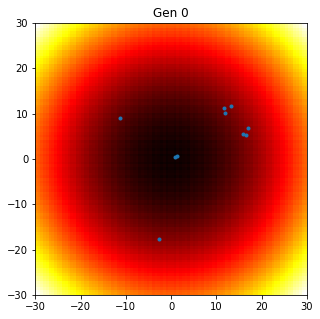

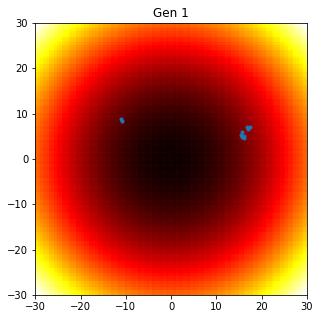

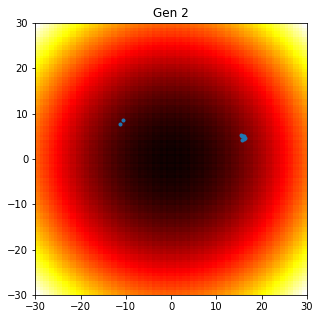

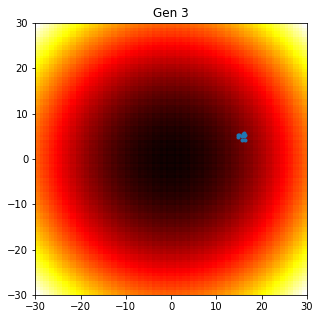

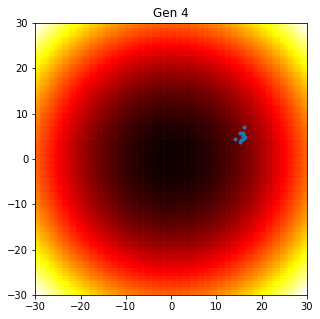

...

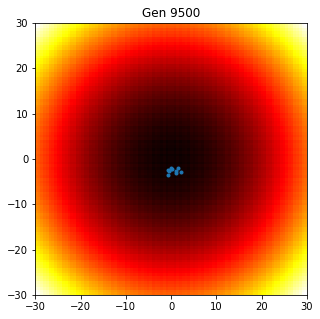

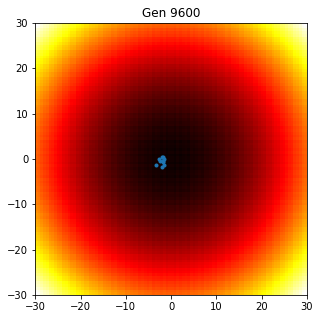

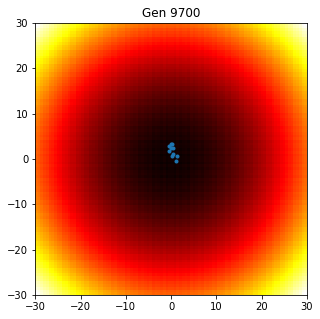

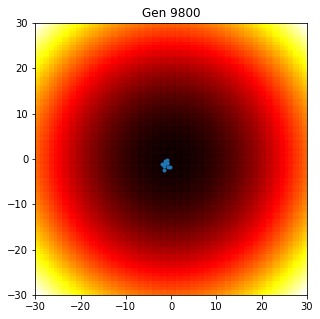

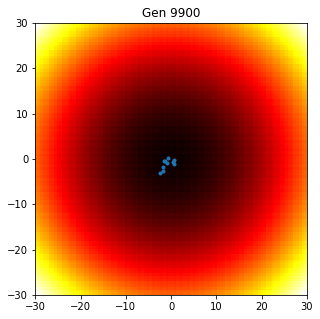

Best fit 84.46407097969798 at iteration 4
Terminé.


In [ ]:
def launch_LambdaES(dim, mu, _lambda, sigma, nbeval=10000, display=True, ma_func=sphere):

  parents = np.random.uniform(-20,20,(_lambda, dim))
  parentsFit = np.array([ma_func(parents[i]) for i in range(_lambda)])
  bestFit = np.min(parentsFit)
  bestIt = 0
  j=0
  while j<nbeval:
    tri = np.argsort(parentsFit)[:mu]
    bestParents = parents[tri]
    children = np.array([np.random.normal(bestParents[np.random.randint(mu)],sigma) for _ in range(_lambda)])
    childrenFit = np.array([ma_func(children[i]) for i in range(_lambda)])

    if(np.min(parentsFit)<bestFit):
      bestFit=np.min(parentsFit)
      bestIt=i

    parents = children
    parentsFit = childrenFit

    if display and ((j<10) or (j%100==0)):
        plot_results(ma_func,children, title="Gen %d"%(j))



    j+=1
  if(display):
    print ("Best fit",bestFit,"at iteration",bestIt)
  return bestFit

launch_LambdaES(16,5,10,0.5,ma_func=rastrigin,display=True)
print ("Terminé.")

Les points de départ importent peu pour cet algorithme. 
Avec un sigma trop petit l'algorithme s'arrète sur un pic local et donc ne trouve pas la meilleur solution (dans le cas de ratrigin par exemple) ou n'atteint pas le centre pour la sphère. Avec un sigma trop grand l'algorithme ne se stabilise pas sur une solution et oscille autour de la meilleur solution avec peu de chance de l'atteindre.

Comparer à l'ancienne fonction, ici on est moins a risque d'un optimal local, mais la convergence est plus difficile avec rastrigin.

---

# Exercice A-4: algorithme CMA-ES

Nous allons maintenant utiliser CMA-ES. La version standard est celle proposée dans la bibliothèque pycma (https://github.com/CMA-ES/pycma).

Vous testerez cette bibliothèque sur les mêmes fonctions que précédemment, toujours en dimension 2 pour l'instant. De même que précédemment, vous tracerez l'évolution de la population pour chaque exécution. 

Vous étudierez l'impact du choix du point initial et du sigma. Vous comparerez également la version complète avec la version pureCMA, qui n'inclut pas certains mécanismes comme le restart. 

(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=731971, Wed Mar 24 19:42:43 2021)


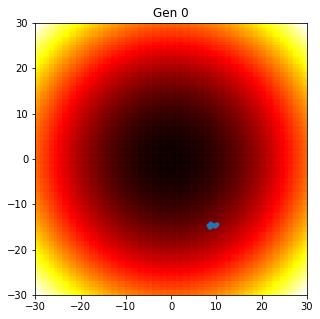

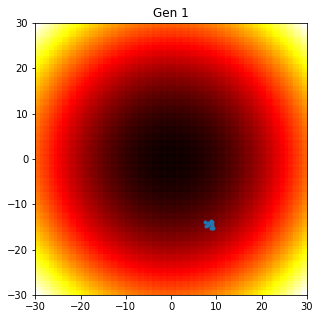

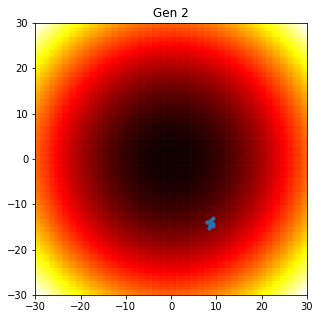

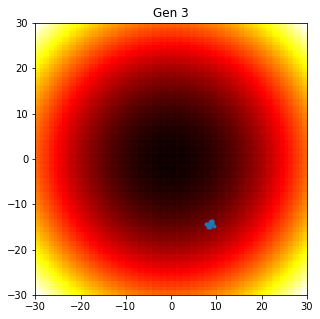

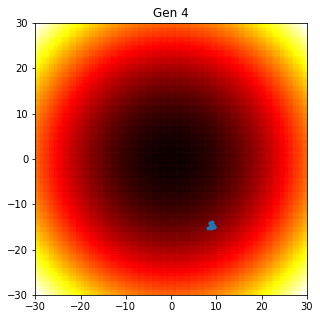

...

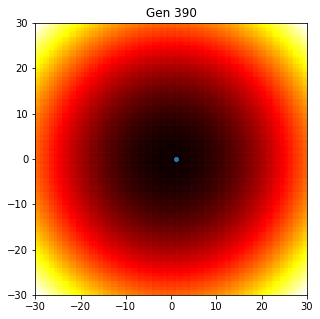

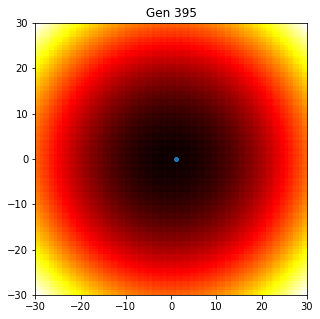

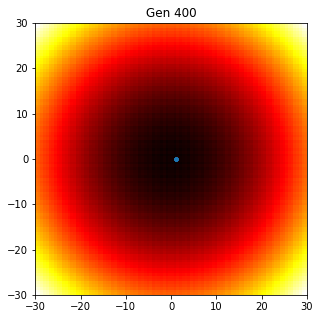

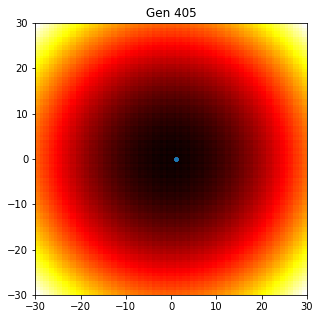

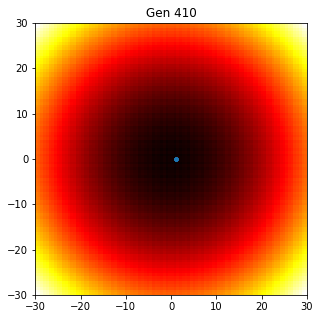

termination by {'tolfun': 1e-11}
best f-value = 17.909232755326684
best solution = [ 9.94958636e-01  4.15450854e-09 -3.74445876e-09 -9.94958636e-01
  9.94958636e-01 -9.94958641e-01 -2.98485570e+00 -2.53552720e-09
 -9.94958646e-01 -9.94958643e-01  1.72597165e-09 -9.94958642e-01
 -2.89075095e-10  9.94958634e-01  8.41699113e-09 -9.94958637e-01]
Terminé.


In [ ]:
import time
def launch_cmaes_full(dim, sigma, nbeval=100, display=True, ma_func=sphere):

  if type(dim) == int:
    center = np.random.uniform(-20,20, dim)
  else:
    center = dim

  es = cma.CMAEvolutionStrategy(center, sigma)  # calls CMAES.__init__()
  j=0
  # this loop resembles the method optimize
  while not es.stop() and j < nbeval:  # iterate
      #X = es.ask()      # get candidate solutions
      X = es.ask()
      f = [ma_func(x) for x in X]
      #X,f = es.ask_and_eval(ma_func)  # evaluate solutions
      #print("F:",f)

      #print("---")
      #print("+++")
      es.tell(X, f)     # do all the real work
      #es.disp(20)       # display info every 20th iteration
      #es.logger.add(es) # log another "data line"
      if(display and (j%5==0 or j<10)):
        plot_results(ma_func,X, title="Gen %d"%(j))

      j+=1
      

  # final output
  if(display):
    print('termination by', es.stop())
    print('best f-value =', es.result[1])
    print('best solution =', es.result[0])
  
  #print('potentially better solution xmean =', es.result[5])
  #print("let's check f(xmean) = ", purecma.ff.elli(es.result[5]))
  #es.logger.plot()  # if matplotlib is available
  return es.result[1],es.result[0]
launch_cmaes_full(16,0.5,ma_func=rastrigin,display=True,nbeval=1000)
print ("Terminé.")

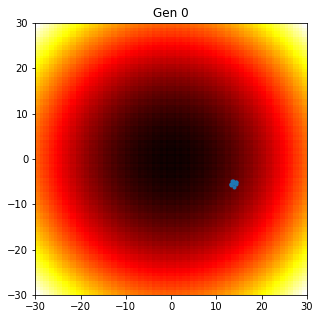

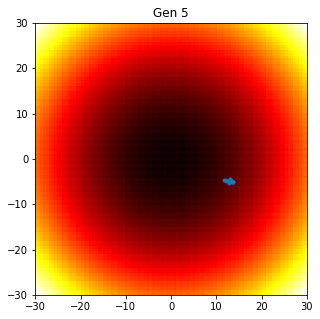

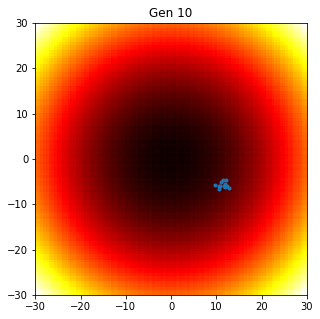

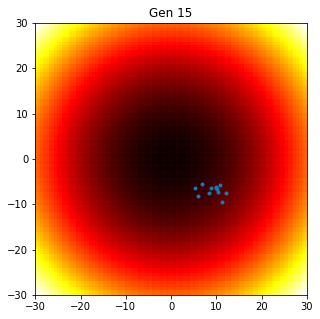

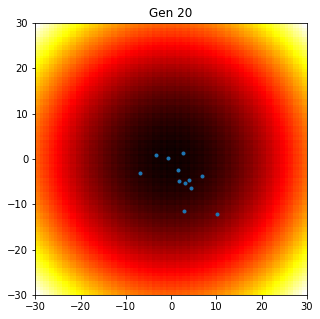

...

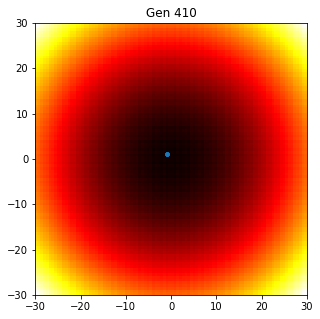

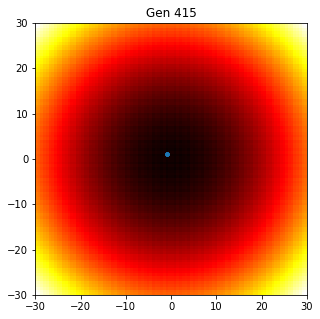

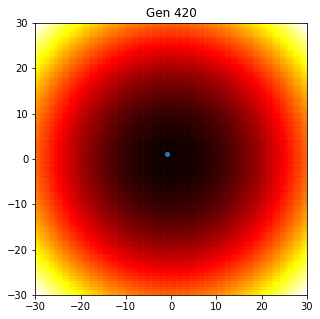

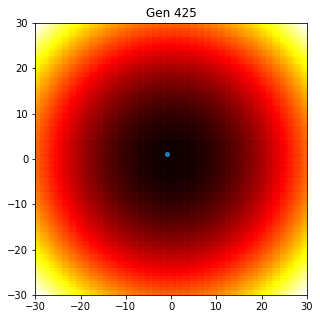

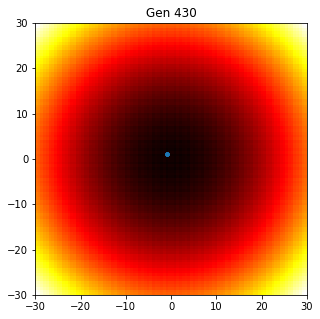

termination by {'tolfun': 1e-12}
best f-value = 32.833598460450276
best solution = [-0.9949586585827304, 0.9949586499509798, 7.720877010048845e-09, 2.984855724071927, 0.9949586416762989, -1.989912247439241, 0.9949586336624449, 0.9949586425661792, 6.987766480744931e-09, -0.994958631856011, 0.9949586421190512, -1.9899122339371296, 1.989912202763375, -1.9899122343816533, 0.9949586248878715, -1.2040782452858658e-08]
Terminé.


In [ ]:
# does not use restart
def launch_cmaes_pure(dim, sigma, nbeval=10000, display=True, ma_func=sphere):
  center = np.random.uniform(-20,20, dim)
  es = purecma.CMAES(center, sigma)  # calls CMAES.__init__()
  j=0
  # this loop resembles the method optimize
  while not es.stop():  # iterate
      X = es.ask()      # get candidate solutions
      f = [ma_func(x) for x in X]  # evaluate solutions

      es.tell(X, f)     # do all the real work
      #es.disp(20)       # display info every 20th iteration
      #es.logger.add(es) # log another "data line"
      solutions = np.array(X)
      if(display and j%5==0):
        plot_results(ma_func,solutions, title="Gen %d"%(j))
      j+=1

  # final output
  if(display):
    print('termination by', es.stop())
    print('best f-value =', es.result[1])
    print('best solution =', es.result[0])

  #print('potentially better solution xmean =', es.result[5])
  #print("let's check f(xmean) = ", purecma.ff.elli(es.result[5]))
  #es.logger.plot()  # if matplotlib is available
  return es.result[1]
launch_cmaes_pure(16,0.5,ma_func=rastrigin,display=True)

print ("Terminé.")

Dans tout les cas le choix des points peut influencer nos résultat, par exemple si on initialise nos points directement au point optimale.

Pour sphere: quand sigma est très grand, CMA-ES converge vers le centre du graphe,
quand sigma est très petit ( < 0.001 ) le point reste bloqué au niveau du point de départ et converge à cet endroit là pour la fonction full alors que pure réussi à converger vers le centre au final.

Pour rastrigin, quand sigma est très grand il n'y a pas d'influence il arrive tôt ou tard a trouve l'optimum global, mais quand sigma est très petit CMA-ES converge vers un optimal local.

Donc pour ratrigin et sphere un sigma grand, n'est pas gênant pour CMA-ES mais un sigma très petit n'est pas suporter, par contre avec la version pure meme un sigma très très petit, il arrive a convergé vers l'optimum global, on peut expliquer par le fait que la version full constate qu'il ne converge pas assez et donc il fait un restart sur un autre point et ainsi de suite, puis termine, alors que le pure il va continuer sans jamais restart et donc a un moment donner il va bien converger vers l'optimum global

Pour ackley, quand sigma est très petit que ce soit avec le pure ou le full, les deux converge vers un minimun local, et quand le sigma est très grand avec le full on ne vois plus du tout les points sur le graphique et il nous dit qu'il a converger et pour le pure il a l'air de continuer a converger mais on ne rien sur le graphique, on peut constaté que le choix du sigma est important, meme si CMA-ES arrive a mieux s'adapter.

ackley par rapport a rastrigin et sphere, est très sensible au sigma, il faut donc choisir un bon sigma dès le debut.

La version Pure est plus adaptée sur de très petit sigma.



---

# Exercice A-5: stabilité des algorithmes d'optimisation stochastique

Vous allez maintenant comparer la stochasticité des algorithmes. Pour cela, observez le code ci-dessous, qui affiche le résultat de plusieurs exécutions du même algorithme de recherche aléatoire sous forme de violin graph. Utilisez la fonction Sphere, tester aussi avec la fonction Rastrigin. 


Best fit 753.3070644964891 at iteration 777
Best fit 675.5909900065376 at iteration 312
Best fit 823.1307623165134 at iteration 128
Best fit 810.4759423434346 at iteration 428
Best fit 853.6150309543586 at iteration 48
Best fit 643.8803249177032 at iteration 996
Best fit 842.6681129487202 at iteration 826
Best fit 826.3157832490463 at iteration 395
Best fit 758.9636133958437 at iteration 670
Best fit 915.2460737820511 at iteration 742
Best fit 732.2337539841807 at iteration 707
Best fit 736.8401629598292 at iteration 473
Best fit 714.0327546149358 at iteration 996
Best fit 860.0759276015342 at iteration 523
Best fit 871.8983707493776 at iteration 814
Best fit 493.24372049462664 at iteration 778
Best fit 854.7615979180249 at iteration 168
Best fit 927.0934948159498 at iteration 533
Best fit 932.1470816145779 at iteration 355
Best fit 747.6998645879033 at iteration 288
Best fit 742.6194553406417 at iteration 920
Best fit 699.5719979311295 at iteration 365
Best fit 718.6012378492743 at it

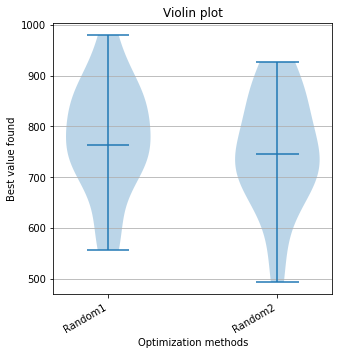

Terminé.


In [ ]:
# fourni a titre d'exemple, ne pas modifier -- répondre dans la cellule suivante.

resRandom1 = []
resRandom2 = []

evaluationBudget = 1000
centerInit = [20]*16
evalFunc = sphere

for i in range(20):
    resRandom1.append ( launch_random(centerInit,nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resRandom2.append ( launch_random(centerInit,nbeval=evaluationBudget,display=False,ma_func=evalFunc) )    
    
allResults = {"Random1":resRandom1,"Random2":resRandom2}

plot_violin( allResults )

print ("Terminé.")


Testez la robustesse de CMA-ES sur plusieurs exécutions sur ces deux fonctions. Vous pouvez ré-utiliser le code de la cellule précédente pour afficher le résultat de plusieurs exécutions de CMAES (ex.: 5 exécutions).

(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=731411, Wed Mar 24 19:44:42 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=771904, Wed Mar 24 19:44:43 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=720418, Wed Mar 24 19:44:53 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=676274, Wed Mar 24 19:44:54 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=679866, Wed Mar 24 19:45:02 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=706563, Wed Mar 24 19:45:03 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=678075, Wed Mar 24 19:45:12 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=637318, Wed Mar 24 19:45:13 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=693951, Wed Mar 24 19:45:22 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=674229, Wed Mar 24 19:45:23 2021)


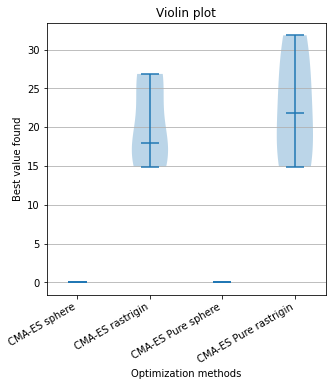

Terminé.


In [ ]:
# A compléter
resRandom1 = []
resRandom2 = []
resRandom3 = []
resRandom4 = []

evaluationBudget = 1000
dim = 16
evalFunc = sphere

for i in range(5):
    resRandom1.append ( launch_cmaes_full(dim,0.5,nbeval=evaluationBudget,display=False,ma_func=sphere)[0] )
    resRandom2.append ( launch_cmaes_full(dim,0.5,nbeval=evaluationBudget,display=False,ma_func=rastrigin)[0] )  
    resRandom3.append ( launch_cmaes_pure(dim,0.5,nbeval=evaluationBudget,display=False,ma_func=sphere) )  
    resRandom4.append ( launch_cmaes_pure(dim,0.5,nbeval=evaluationBudget,display=False,ma_func=rastrigin) )    
    
allResults = {"CMA-ES sphere":resRandom1,"CMA-ES rastrigin":resRandom2,"CMA-ES Pure sphere":resRandom3,"CMA-ES Pure rastrigin":resRandom4}

plot_violin( allResults )

print ("Terminé.")

Sur la fonction sphere, CMA-ES trouve à chaque fois une solution extrèmement proche du centre de la figure, il y a très peu de différences entre chaque solutions trouvées.
Pour la fonction rastrigin, CMA-ES trouve des solutions proche de l'optimum (entre 15 et 45 de distance) mais les solutions sont beaucoup moins proches les unes des autres, on peut donc avoir des valeurs différentes sur plusieurs itérations quand la fonction est complexe et contient des optimums locaux. On pourrait expliqué le fait que la version full, trouve de meilleur solution, car elle fait un restart sur tout les points initials et donc il y a une meilleur chance de trouver de meilleures solutions.

La version pure et full n'ont pas trop de différences dans ce cas là.

# Exercice A-6: comparaison entre les algorithmes

 Vous allez maintenant comparer tous les algorithmes précédents en traçant les résultat sur une même figure. Sur la même figure, vous tracerez aussi les résultats de deux méthodes classiques d'optimisation: Nelder-Mead et Powell (cf. **fichier `myCMA.py`**).  Vous pouvez tout écrire dans la cellule ci-dessous.

_Remarque: Pour que les comparaisons soient équitables, il faut que les points de départ des optimisation "classiques" soient similaires. Vous pourrez éventuellement ajouter un diagramme représentant le nombre d'évaluation par méthode._

(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=719781, Wed Mar 24 20:04:36 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=717368, Wed Mar 24 20:04:40 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=784704, Wed Mar 24 20:04:44 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=704905, Wed Mar 24 20:04:49 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=762287, Wed Mar 24 20:04:53 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=697502, Wed Mar 24 20:04:58 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=687822, Wed Mar 24 20:05:02 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=729630, Wed Mar 24 20:05:06 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=689191, Wed Mar 24 20:05:11 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=754834, Wed Mar 24 20:05:15 2021)

######################################################
##################Avec :

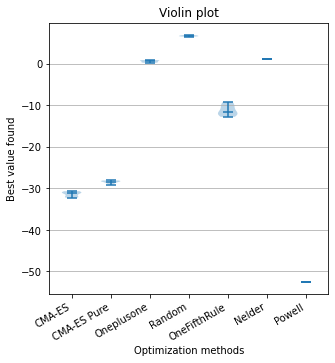

######################################################

(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=714448, Wed Mar 24 20:05:20 2021)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in log


(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=723980, Wed Mar 24 20:05:26 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=768162, Wed Mar 24 20:05:31 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=737097, Wed Mar 24 20:05:38 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=635327, Wed Mar 24 20:05:44 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=767224, Wed Mar 24 20:05:50 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=725855, Wed Mar 24 20:05:56 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=772589, Wed Mar 24 20:06:02 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=751457, Wed Mar 24 20:06:08 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=720757, Wed Mar 24 20:06:14 2021)

######################################################
##################Avec : RASTRIGIN##################


/usr/local/lib/python3.7/dist-packages/numpy/core/function_base.py:127: RuntimeWarning: invalid value encountered in double_scalars
  delta = stop - start


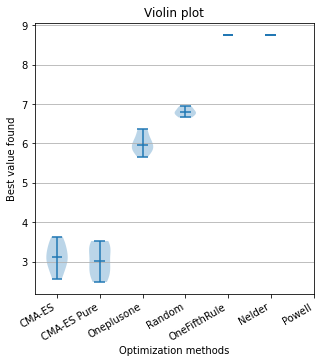

######################################################

(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=697725, Wed Mar 24 20:06:21 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=788836, Wed Mar 24 20:06:25 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=661431, Wed Mar 24 20:06:31 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=771935, Wed Mar 24 20:06:38 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=727621, Wed Mar 24 20:06:45 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=747729, Wed Mar 24 20:06:52 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=709031, Wed Mar 24 20:06:58 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=763454, Wed Mar 24 20:07:05 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=668320, Wed Mar 24 20:07:13 2021)
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=672224, Wed Mar 24 20:07:19 2021)

#######################

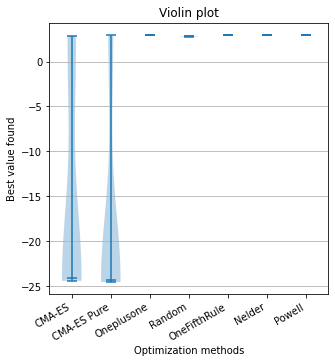

######################################################

Terminé.


In [ ]:
def launch_nelder(center, nbeval=10000, display=False, ma_func=sphere): 
	nelder = minimize(ma_func, center, method='nelder-mead',options={'xtol': 1e-8, 'disp': display}) 
	return nelder.fun 
def launch_powell(center, nbeval=10000, display=False, ma_func=sphere): 
	powell = minimize(ma_func, center, method='powell',options={'xtol': 1e-8, 'disp': display}) 
	return powell.fun

# A compléter
evaluationBudget = 1000
dim = 16
centerInit = [20]*16
evalFunc = [sphere,rastrigin,ackley]
name = ['SPHERE','RASTRIGIN','ACKLEY']
for n in range(len(evalFunc)):
  resCMAfull = []
  resCMApure = []
  resOneplusone = []
  resRandom = []
  resOneFifthRule = []
  resNelder = []
  resPowell = []
  for i in range(5):
      try:
        resCMAfull.append( np.log(launch_cmaes_full(dim,0.5,nbeval=evaluationBudget,display=False,ma_func=evalFunc[n])[0]) )
        resCMApure.append( np.log(launch_cmaes_pure(dim,0.5,nbeval=evaluationBudget,display=False,ma_func=evalFunc[n])))  
        resOneplusone.append( np.log(launch_oneplusone(centerInit,0.5,nbeval=evaluationBudget,display=False,ma_func=evalFunc[n])) )  
        resRandom.append( np.log(launch_random(centerInit,nbeval=evaluationBudget,display=False,ma_func=evalFunc[n])))
        resOneFifthRule.append( np.log(launch_ESonefifthRule(centerInit,0.5,nbeval=evaluationBudget,display=False,ma_func=evalFunc[n])))
        resNelder.append( np.log(launch_nelder(centerInit,nbeval=evaluationBudget,display=False,ma_func=evalFunc[n])))
        resPowell.append( np.log(launch_powell(centerInit,nbeval=evaluationBudget,display=False,ma_func=evalFunc[n])))
      except ZeroDivisionError:
        pass

  allResults = {"CMA-ES":resCMAfull,"CMA-ES Pure":resCMApure,"Oneplusone":resOneplusone,"Random":resRandom,"OneFifthRule":resOneFifthRule,"Nelder":resNelder,"Powell":resPowell}
  print('\n######################################################')
  print('##################Avec : '+name[n]+'##################')
  plot_violin( allResults )
  print('######################################################\n')

print ("Terminé.")

On a choisis d'afficher les résultats en représentation logarithmique, car les données étaient très proches, et donc les résultats sous forme de log sont plus adapter ici.

Powell semble la méthode la plus efficace pour trouver l'optimum quelle que soit la fonction choisie sauf pour la fonction ackley, cette méthode trouve 0 pour certaines de ces réponse c'est pourquoi elle n'apparait pas sur certains graphes (qui sont en log). 
Ensuite la plus efficace est CMA-ES et CMA-ES pure qui sont legerement moins efficace mais qui trouve des solutions proche de 0 sauf pour ackley où CMA-ES et CMA-ES pure sont les meilleures.
Pour la fonction ackley, les autres méthodes semble donner des résultats similaires quand les résultats sont sous une représentation logarithmique.

Pour la fonction sphere, One fifth rule est la meilleure suivie par 1+1 et Nelder, la moins bonne est random.
Pour la fonction rastrigin, one fifth rule et Nelder donne de mauvais résultat, les résultats de 1+1 et random sont meilleurs que ces deux là.

En conclusion, les résultats semblent concordée avec nos remarques faites avant, où CMA-ES semble plus efficace dans la plupart des cas et que les méthode du début, comme la méthode random n'est pas du tout efficace, seule Powell est meilleur que CMA-ES. Mais sur des fonctions spéciale tel que Rastrigin, la donne change et la méthode aléatoire est plus efficace que le 1+1 avec 1/5, et celà semble logique, car la méthode du random n'est pas soumis au convergence vers des optimaux locaux, comparer au 1+1 avec 1/5, certe qui converge plus rapidement mais qui peut rapidement être dans un optimal local. Et sur Ackley un fonction où la convergence est plus difficle, Powell revient au même niveau que tout les autres méthodes (d'un point de vue logarithmique), où seule les méthodes CMA-ES avec une grande écart-type, mais arrive a mieux s'en sortir.



---
---
---

# <font color='orange'>PARTIE B: optimisation d'un pendule inversé</font>

OpenAI Gym (https://gym.openai.com/) est un framework permettant de lancer facilement des expériences d'apprentissage par renforcement. Nous allons l'utiliser pour tester les algorithmes évolutionnistes. Pour cet exercice, vous êtes laissé en autonomie: vous devez donc lire attentivement la documentation et les exemples.

# Importation des librairies et définition des fonctions utiles pour la partie B

Remarque: *Il est nécessaire d'exécuter ces cellules une seule fois. En cas de redémarrage du noyau, il faut relancer ces cellules. Il n'est pas nécessaire de regarder le code de ces cellules, elles servent seulement de soutien à la partie B.*

In [25]:
# source: https://colab.research.google.com/drive/124koV4mf1tQ4av9jAJJuWsyuhJyLyd70#scrollTo=G9UWeToN4r7D

#remove " > /dev/null 2>&1" to see what is going on under the hood
!pip install pyvirtualdisplay > /dev/null 2>&1
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()

!apt-get update > /dev/null 2>&1
!apt-get install cmake > /dev/null 2>&1
!pip install --upgrade setuptools 2>&1
!pip install ez_setup > /dev/null 2>&1
!pip install gym[atari] > /dev/null 2>&1

from datetime import datetime
from datetime import date

from gym.wrappers import Monitor
import base64
import glob
import io
import base64
from IPython.display import HTML
from IPython import display as ipythondisplay

import gym
from gym import logger as gymlogger
from gym.wrappers import Monitor
gymlogger.set_level(40) #error only
import tensorflow as tf
import numpy as np
import random
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import math
import glob
import io
import base64
from IPython.display import HTML

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")

Requirement already up-to-date: setuptools in /usr/local/lib/python3.7/dist-packages (54.2.0)

 2021-03-25 16:46:41 GMT
OK.


In [26]:
# source: https://colab.research.google.com/drive/124koV4mf1tQ4av9jAJJuWsyuhJyLyd70#scrollTo=G9UWeToN4r7D
# modification mineur: ajout de l'argument loop dans la fonction show_video(loop=True)

"""
Utility functions to enable video recording of gym environment and displaying it
To enable video, just do "env = wrap_env(env)""
"""

def show_video(loop=True):
  mp4list = glob.glob('video/*.mp4')
  if len(mp4list) > 0:
    mp4 = mp4list[0]
    video = io.open(mp4, 'r+b').read()
    encoded = base64.b64encode(video)
    if loop == True:
      ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                loop controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
    else:
      ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
  else: 
    print("Could not find video")
    
def wrap_env(env):
  env = Monitor(env, './video', force=True)
  return env

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 16:46:41 GMT
OK.


In [27]:
# A simple neural network object
# source: https://github.com/AsmaBRZ/Evolutionary-algorithms/blob/master/fixed_structure_nn_numpy.py

# coding: utf-8

import numpy as np

## Suppress TF info messages

import os

def sigmoid(x):
    return 1./(1 + np.exp(-x))

def tanh(x):
    return np.tanh(x)


def gen_simplemlp(n_in, n_out, n_hidden_layers=2, n_neurons_per_hidden=5):
    n_neurons = [n_neurons_per_hidden]*n_hidden_layers if np.isscalar(n_neurons_per_hidden) else n_neurons_per_hidden
    i = Input(shape=(n_in,))
    x = i
    for n in n_neurons:
        x = Dense(n, activation='sigmoid')(x)
    o = Dense(n_out, activation='tanh')(x)
    m = Model(inputs=i, outputs=o)
    return m
    

class SimpleNeuralControllerNumpy():
    def __init__(self, n_in, n_out, n_hidden_layers=2, n_neurons_per_hidden=5, params=None):
        self.dim_in = n_in
        self.dim_out = n_out
        # if params is provided, we look for the number of hidden layers and neuron per layer into that parameter (a dicttionary)
        if (not params==None):
            if ("n_hidden_layers" in params.keys()):
                n_hidden_layers=params["n_hidden_layers"]
            if ("n_neurons_per_hidden" in params.keys()):
                n_neurons_per_hidden=params["n_neurons_per_hidden"]
        self.n_per_hidden = n_neurons_per_hidden
        self.n_hidden_layers = n_hidden_layers
        self.weights = None 
        self.n_weights = None
        self.init_random_params()
        self.out = np.zeros(n_out)
        #print("Creating a simple mlp with %d inputs, %d outputs, %d hidden layers and %d neurons per layer"%(n_in, n_out,n_hidden_layers, n_neurons_per_hidden))

    
    def init_random_params(self):
        if(self.n_hidden_layers > 0):
            self.weights = [np.random.random((self.dim_in,self.n_per_hidden))] # In -> first hidden
            self.bias = [np.random.random(self.n_per_hidden)] # In -> first hidden
            for i in range(self.n_hidden_layers-1): # Hidden -> hidden
                self.weights.append(np.random.random((self.n_per_hidden,self.n_per_hidden)))
                self.bias.append(np.random.random(self.n_per_hidden))
            self.weights.append(np.random.random((self.n_per_hidden,self.dim_out))) # -> last hidden -> out
            self.bias.append(np.random.random(self.dim_out))
        else:
            self.weights = [np.random.random((self.dim_in,self.dim_out))] # Single-layer perceptron
            self.bias = [np.random.random(self.dim_out)]
        self.n_weights = np.sum([np.product(w.shape) for w in self.weights]) + np.sum([np.product(b.shape) for b in self.bias])

    def get_parameters(self):
        """
        Returns all network parameters as a single array
        """
        flat_weights = np.hstack([arr.flatten() for arr in (self.weights+self.bias)])
        return flat_weights

    def set_parameters(self, flat_parameters):
        """
        Set all network parameters from a single array
        """
        i = 0 # index
        to_set = []
        self.weights = list()
        self.bias = list()
        if(self.n_hidden_layers > 0):
            # In -> first hidden
            w0 = np.array(flat_parameters[i:(i+self.dim_in*self.n_per_hidden)])
            self.weights.append(w0.reshape(self.dim_in,self.n_per_hidden))
            i += self.dim_in*self.n_per_hidden
            for l in range(self.n_hidden_layers-1): # Hidden -> hidden
                w = np.array(flat_parameters[i:(i+self.n_per_hidden*self.n_per_hidden)])
                self.weights.append(w.reshape((self.n_per_hidden,self.n_per_hidden)))
                i += self.n_per_hidden*self.n_per_hidden
            # -> last hidden -> out
            wN = np.array(flat_parameters[i:(i+self.n_per_hidden*self.dim_out)])
            self.weights.append(wN.reshape((self.n_per_hidden,self.dim_out)))
            i += self.n_per_hidden*self.dim_out
            # Samefor bias now
            # In -> first hidden
            b0 = np.array(flat_parameters[i:(i+self.n_per_hidden)])
            self.bias.append(b0)
            i += self.n_per_hidden
            for l in range(self.n_hidden_layers-1): # Hidden -> hidden
                b = np.array(flat_parameters[i:(i+self.n_per_hidden)])
                self.bias.append(b)
                i += self.n_per_hidden
            # -> last hidden -> out
            bN = np.array(flat_parameters[i:(i+self.dim_out)])
            self.bias.append(bN)
            i += self.dim_out
        else:
            n_w = self.dim_in*self.dim_out
            w = np.array(flat_parameters[:n_w])
            self.weights = [w.reshape((self.dim_in,self.dim_out))]
            self.bias = [np.array(flat_parameters[n_w:])]
        self.n_weights = np.sum([np.product(w.shape) for w in self.weights]) + np.sum([np.product(b.shape) for b in self.bias])
    
    def predict(self,x):
        """
        Propagate
        """
        if(self.n_hidden_layers > 0):
            #Input
            a = np.matmul(x,self.weights[0]) + self.bias[0]
            y = sigmoid(a)
            # hidden -> hidden
            for i in range(1,self.n_hidden_layers-1):
                a = np.matmul(y, self.weights[i]) + self.bias[i]
                y = sigmoid(a)
            # Out
            a = np.matmul(y, self.weights[-1]) + self.bias[-1]
            out = tanh(a)
            return out
        else: # Simple monolayer perceptron
            return tanh(np.matmul(x,self.weights[0]) + self.bias[0])

    def __call__(self,x):
        """Calling the controller calls predict"""
        return self.predict(x)

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 16:46:42 GMT
OK.


---

# Question B-0: simution du pendule inversé

Le code ci-dessous montre comment lancer la simulation d'un pendule inversé en utilisant OpenAI Gym. Etudiez-le et exécutez-le.



In [ ]:
import gym
#env = gym.make('CartPole-v1')
env = wrap_env( gym.make('CartPole-v1') ) # colab-specific
observation = env.reset()

#for _ in range(1000):
#while True:
maxEvaluations = 10
evaluation = 0
while evaluation < maxEvaluations:
    env.render()
    action = env.action_space.sample() 
    observation, reward, done, info = env.step(action) 

    if done:
      evaluation = evaluation + 1
      observation = env.reset()
      #print ("obs:",observation,type(observation),observation.shape)
      #show_video(False) # colab-specific

env.close()

show_video() # colab-specific

# Question B-1

En partant de l'exemple de la documentation et du code fourni pour le réseau de neurones dans la première cellule ci-dessous, faites une expérience pour optimiser les paramètres d'un réseau de neurones contrôlant un pendule inversé (environnement 'CartPole-v1') avec CMA-ES. Imposez une limite à 500 pas de temps au-delà de laquelle l'expérience est considérée comme réussie. 

In [28]:
# Exemple de création d'un réseau de neurones multi-couches ("multi-layered perceptron")

nbInputs = 4
nbOutputs = 1
nbHiddenLayers = 2
nbNeuronsPerLayer = 5

nn=SimpleNeuralControllerNumpy(nbInputs,nbOutputs,nbHiddenLayers,nbNeuronsPerLayer) 

# NN parameters

theta = nn.get_parameters() # get default parameters
for i in range(len(theta)):
  theta[i] = random.random()*2.0-1.0 # set our own parameter values
nn.set_parameters(theta)
print ("NN parameters:",theta)

# running NN

observation = np.array( [ -0.03760372,0.00724161,-0.03663132,0.01225319 ], np.float64 )

print ("Input values:", observation)

outputValues = nn.predict(observation)

print ("Output values:", outputValues)


NN parameters: [-0.93327226  0.86077446 -0.67057738  0.26811049  0.0247075  -0.11802154
 -0.02012971 -0.05511049  0.25791714  0.1863443   0.33476193 -0.98459101
 -0.36409736 -0.82281254  0.52885522 -0.08927213 -0.34982848  0.67569727
  0.88878289  0.95742967  0.62236686 -0.03191422  0.48028359 -0.92964512
  0.96202509 -0.14926041  0.89167775 -0.49101303 -0.65260622 -0.66098732
 -0.05684391  0.00995848  0.93646921  0.74070826 -0.24610466  0.54856207
  0.33091648  0.75157066  0.2319728   0.93892874 -0.50364383  0.94418306
 -0.39167708  0.78073996  0.24164077  0.63162637  0.53406572 -0.10683278
  0.54261499 -0.43468421  0.82123869 -0.4915121  -0.0355007  -0.59792194
  0.36021789 -0.65757821  0.32122422 -0.67769858  0.07237152 -0.32207509
 -0.55723452]
Input values: [-0.03760372  0.00724161 -0.03663132  0.01225319]
Output values: [-0.02556392]


In [123]:
import time
import gym

def fit(x,nn,env):
  observation = env.reset()

  it = 0
  sum_reward = 0
  nn.set_parameters(x)
  while True:
      p = nn.predict(observation)[0]
      action = abs(round(p))

      observation, reward, done, info = env.step(action) 
      sum_reward += reward

      if done:
        break

  #print(500-sum_reward)
  return 500-sum_reward



def launch_cmaes_full2(dim, sigma, nn, nbeval=10000, display=True, ma_func=fit):

  if type(dim) == int:#manière de créer aléatoirement les données de départ
    center = np.random.uniform(-20,20, dim)
  else:
    center = dim

  env = wrap_env( gym.make('CartPole-v1') ) # colab-specific
  es = cma.CMAEvolutionStrategy(center, sigma)  
  j=0
  bestfit=[500]
  bestOfGen=[]
  meanOfGen=[]

  while not es.stop() and j < nbeval : 
    try:

      X = es.ask()
      f = [ma_func(x,nn,env) for x in X]

      bf=min(min(f),min(bestfit))
      mean=np.mean(f)

      print(' Iteration :',j," bestfit du list:",min(f),' mean du list :',mean,' bestfit :',bf)
      #Ajout des données pour l'affichage des plots
      bestOfGen.append(min(f))
      meanOfGen.append(mean)
      bestfit.append(bf)
      es.tell(X, f)

      j+=1
    except KeyboardInterrupt:
      env.close()
      break

  # final output
  env.close()
  bestfit = -1*np.array(bestfit)+500
  bestOfGen = -1*np.array(bestOfGen)+500
  meanOfGen = -1*np.array(meanOfGen)+500
  print('termination by', es.stop())
  print('best f-value =', es.result[1])
  print('best solution =', es.result[0])
  if(display):
    plt.figure()
    plt.plot(bestfit,label='bestfit')
    plt.plot(bestOfGen,label='bestOfGen')
    plt.plot(meanOfGen,label='meanOfGen')
    plt.title('Strategie Evolution + Neural Network')
    plt.xlabel('Nombre d\'itération')
    plt.ylabel('Nombres d\'itération réussite')
    plt.legend()


  return es.result[1],es.result[0]


print ("Terminé.")

Terminé.


(8_w,16)-aCMA-ES (mu_w=4.8,w_1=32%) in dimension 61 (seed=753173, Thu Mar 25 17:50:01 2021)
 Iteration : 0  bestfit du list: 442.0  mean du list : 483.5  bestfit : 442.0
 Iteration : 1  bestfit du list: 435.0  mean du list : 482.5  bestfit : 435.0
 Iteration : 2  bestfit du list: 451.0  mean du list : 480.5  bestfit : 435.0
 Iteration : 3  bestfit du list: 444.0  mean du list : 480.9375  bestfit : 435.0
 Iteration : 4  bestfit du list: 436.0  mean du list : 478.375  bestfit : 435.0
 Iteration : 5  bestfit du list: 367.0  mean du list : 458.0  bestfit : 367.0
 Iteration : 6  bestfit du list: 398.0  mean du list : 470.875  bestfit : 367.0
 Iteration : 7  bestfit du list: 395.0  mean du list : 466.375  bestfit : 367.0
 Iteration : 8  bestfit du list: 338.0  mean du list : 449.875  bestfit : 338.0
 Iteration : 9  bestfit du list: 363.0  mean du list : 466.375  bestfit : 338.0
 Iteration : 10  bestfit du list: 374.0  mean du list : 435.125  bestfit : 338.0
 Iteration : 11  bestfit du list: 

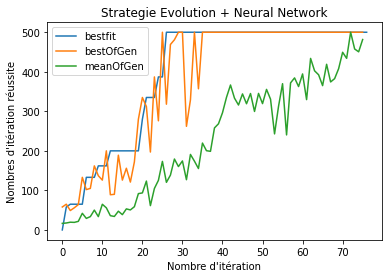

In [124]:
# A compléter 
nbInputs = 4
nbOutputs = 1
nbHiddenLayers = 2
nbNeuronsPerLayer = 5

nn=SimpleNeuralControllerNumpy(nbInputs,nbOutputs,nbHiddenLayers,nbNeuronsPerLayer) 

# NN parameters

theta = nn.get_parameters() # get default parameters
for i in range(len(theta)):
  theta[i] = random.random()*2.0-1.0 # set our own parameter values
nn.set_parameters(theta)

t = time.time()
bestFit, parameters = launch_cmaes_full2(nn.get_parameters(), 0.5, nn, nbeval=1000, display=True, ma_func=fit)
t2 = time.time() - t 
nn.set_parameters(parameters)

print("Strategie Evolution + Neural Network : Training time = ",t2/60,' min')

On peut voir sur notre graphe à la fin de l'execution(à la fin de tout les affichage console) que notre algorithme converge assez rapidement, a environ 20-40 itérations, il a déjà trouvé les paramètres optimaux, et on peut voir aussi que les meilleurs fits de chaque itération et aussi la moyenne de tout les fits de chaque itération semble converger vers la solution optimale, on peut supposer ici que plus l'algorithme avance moins il y a d'erreur sur toute les fits de chaque itération.

A noter que l'execution est très rapide, malgrès le boucle dans notre fonction fit, car on a limité à 500 itération.

--- 

# Question B-2

Re-calculez plusieurs fois la fitness du meilleur contrôleur généré. Visualisez les comportements correspondants. Que constatez-vous ? Quel est le problème ? Proposez une solution pour le résoudre.

In [118]:
def run(display=True):
  observation = env.reset()
  evaluation = 0
  it=0
  while True:
      env.render()
      
      p = nn.predict(observation)[0]
      action = abs(round(p))

      observation, reward, done, info = env.step(action) 
      it+=reward
      if done:
        print('Iteration : ', it)
        print ("obs:",observation)
        break
  if display:
    env.close()
    print('Moyenne absolue des Observations '+str("{:.3f}".format(np.mean(np.abs(observation)))))
    show_video(False)
  else:
    return it,str("{:.3f}".format(np.mean(np.abs(observation))))

In [80]:
env = wrap_env( gym.make('CartPole-v1') ) # colab-specific
y = []
x = []
for _ in range(10):
  fitness, init = run(display=False)
  y.append(fitness)
  x.append(init)

Iteration :  500.0
obs: [-0.39672598 -0.04427025 -0.00045599  0.02089159]
Iteration :  500.0
obs: [ 1.28751731  0.34413993  0.00499226 -0.24446834]
Iteration :  500.0
obs: [ 0.07878335  0.00167574 -0.00634475  0.01558119]
Iteration :  209.0
obs: [2.42497214 1.67726879 0.1432212  0.00446603]
Iteration :  207.0
obs: [2.40202476 1.63383817 0.15108415 0.04419282]
Iteration :  500.0
obs: [-0.08097592 -0.02318475 -0.00707185  0.01447504]
Iteration :  500.0
obs: [-0.29074092 -0.03637313  0.00563697  0.00463154]
Iteration :  500.0
obs: [-0.03130804 -0.00600498 -0.00267043  0.01919149]
Iteration :  500.0
obs: [ 0.08455296 -0.00585327 -0.00130918  0.03135542]
Iteration :  277.0
obs: [ 2.42360856  1.68428663  0.14898898 -0.00420342]


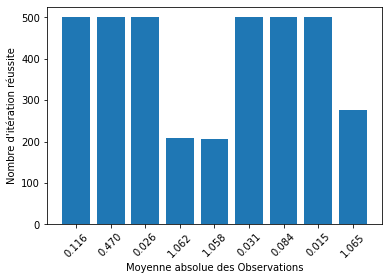

In [109]:
plt.xlabel('Moyenne absolue des Observations')
plt.ylabel('Nombre d\'itération réussite')
plt.xticks(rotation=45 )
plt.bar(x,y)

In [122]:
for u in range(5):
  env = wrap_env( gym.make('CartPole-v1') ) # colab-specific sinon il affiche le meme vidéo
  run()


Iteration :  405.0
obs: [-2.40450486 -0.50723392 -0.00791546  0.22488032]
Moyenne absolue des Observations 0.786


Iteration :  237.0
obs: [2.4159991  1.59810697 0.13378568 0.06229234]
Moyenne absolue des Observations 1.053


Iteration :  500.0
obs: [-1.16042087 -0.33000872 -0.00215138  0.30010837]
Moyenne absolue des Observations 0.448


Iteration :  500.0
obs: [-1.99209762 -0.40861038  0.00226832  0.26161349]
Moyenne absolue des Observations 0.666


Iteration :  173.0
obs: [2.41904118 1.58129653 0.15065888 0.45673071]
Moyenne absolue des Observations 1.152


On a réalisé un graphe où on a utilisé la moyenne absolue des valeurs des observations de départ, ce qui montre que quand les données d'observation varient suffisamment, alors notre réseau de neurones n'est plus assez efficace.
(à noter que la moyenne n'est pas une solution parfaite, mais dans notre cas cela nous montre des résultats assez efficaces)

Les vidéos réalisées concordent avec les données du graphe, les résultats nous montre que les fitness ne sont pas bons quand les conditions ou les Observations sont suffisamment différente.

On constate que les résultats après l'optimisation par CMAES de notre réseau de neurones, et que sur nos tests de fitness, ne réussissent pas a tout les coup et dès que l'initialisation, ici la variable observation est un peu différente que celle qui a était appris lors des fits, alors le taux de réussite n'est plus garanti, car nos observations de départ sont générées aléatoirement, ce problème est lié au fait que lors de l'évaluation, on évalue qu'une seul simulation par theta et donc ce theta n'est pas robuste quand les conditions initiale change. Une solution possible pour résoudre ce problème serait donc de tester ce même Theta plusieurs fois pour évaluer sa moyenne de son fitness sur plusieurs observation différente, pour tester sa robustesse.



À noter : quelque fois les vidéos "crash" sur Google Collab

---
---
---

# <font color='orange'>PARTIE C: exercices bonus</font>

Si vous avez fini tout le reste... A faire en complète autonomie.


# Question C-1: 

A partir de l'implémentation (1+lambda)-ES, implémenter (1) un algorithme (1,lambda)-ES, puis (mu+lambda)-ES et (mu,lambda)-ES. Etudiez l'influence des valeurs de mu et lambda.


In [ ]:
# A compléter

# Question C-2:

A partir de l'expérience du pendule inversé, faites le même genre d'expériences avec d'autres environnement proposé dans OpenAI gym, par exemple le BipedalWalker (attention, le temps nécessaire pour l'optimisation peut rapidement devenir très long)


In [ ]:
# A compléter

*Fin du sujet.*
